In [282]:
# sphinx_gallery_thumbnail_number = 2

# Authors: Robert Luke <mail@robertluke.net>
#
# License: BSD (3-clause)

# Import common libraries
from collections import defaultdict
from copy import deepcopy
from itertools import compress
from pprint import pprint

# Import Plotting Library
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import numpy as np
import os
import pywt


# Import StatsModels
import statsmodels.formula.api as smf
from mne import Epochs, events_from_annotations, set_log_level
from mne.preprocessing.nirs import (
    beer_lambert_law,
    optical_density,
    scalp_coupling_index,
    temporal_derivative_distribution_repair,
    
)

# Import MNE processing
from mne.viz import plot_compare_evokeds

# Import MNE-BIDS processing
from mne_bids import BIDSPath, read_raw_bids


# Import MNE-NIRS processing
from mne_nirs.channels import get_long_channels, picks_pair_to_idx
from mne_nirs.datasets import fnirs_motor_group
from mne_nirs.signal_enhancement import (enhance_negative_correlation, short_channel_regression)
from mne_nirs.channels import (get_long_channels,
                               get_short_channels,
                               picks_pair_to_idx)

from collections import defaultdict
import numpy as np
from itertools import compress
from sklearn.decomposition import PCA

# Set general parameters
set_log_level("WARNING")  # Don't show info, as it is repetitive for many subjects

In [ ]:
import mne
# cropping the signal before sci calculation
def individual_analysis(bids_path):
    # Read data with annotations in BIDS format
    raw_intensity = read_raw_bids(bids_path=bids_path, verbose=False)
    # check if coordinates of the channels
    
    
    #print(raw_intensity.ch_names)

    
    # Get event timings
    #print("Extracting event timings...")
    Breaks, _ = mne.events_from_annotations(raw_intensity, {'Xstart': 4, 'Xend': 5})
    AllEvents, _ = mne.events_from_annotations(raw_intensity)
    Breaks = Breaks[:, 0] / raw_intensity.info['sfreq']
    LastEvent = AllEvents[-1, 0] / raw_intensity.info['sfreq']
    
    if len(Breaks) % 2 == 0:
        raise ValueError("Breaks array should have an odd number of elements.")
    
    original_duration = raw_intensity.times[-1] - raw_intensity.times[0]
    #print(f"Original duration: {original_duration:.2f} seconds")
    
    # Cropping dataset
    #print("Cropping the dataset...")
    cropped_intensity = raw_intensity.copy().crop(Breaks[0], Breaks[1])
    for j in range(2, len(Breaks) - 1, 2):
        block = raw_intensity.copy().crop(Breaks[j], Breaks[j + 1])
        cropped_intensity.append(block)
    cropped_intensity.append(raw_intensity.copy().crop(Breaks[-1], LastEvent + 15.25))
    
    cropped_duration = cropped_intensity.times[-1] - cropped_intensity.times[0]
    #print(f"Cropped duration: {cropped_duration:.2f} seconds")
    
    if cropped_duration >= original_duration:
        print(f"WARNING: Cropping did not reduce duration!")
    
    raw_intensity_cropped = cropped_intensity.copy()

    

    
    # Remove break annotations
    print("Removing break annotations for the orginal raw...")
    raw_intensity.annotations.delete(np.where(
        (raw_intensity.annotations.description == 'Xstart') | 
        (raw_intensity.annotations.description == 'Xend') | 
        (raw_intensity.annotations.description == 'BAD boundary') | 
        (raw_intensity.annotations.description == 'EDGE boundary')
    )[0])
    
    print("Removing break annotations for the cropped raw...")
    raw_intensity_cropped.annotations.delete(np.where(
        (raw_intensity_cropped.annotations.description == 'Xstart') | 
        (raw_intensity_cropped.annotations.description == 'Xend') | 
        (raw_intensity_cropped.annotations.description == 'BAD boundary') | 
        (raw_intensity_cropped.annotations.description == 'EDGE boundary')
    )[0]) 
    
    
    #downsampling the signal
    #raw_intensity_cropped.resample(3)
    
    # Convert signal to optical density and determine bad channels
    raw_od = optical_density(raw_intensity)
    raw_od_cropped = optical_density(raw_intensity_cropped)
    
    # get the total number of short channels
    short_chs = get_short_channels(raw_od)
    tot_number_of_short_channels = len(short_chs.ch_names)
    

    # sci calculated
    sci = scalp_coupling_index(raw_od_cropped, l_freq=0.7, h_freq=1.45)
    #sci = scalp_coupling_index(raw_od_cropped, h_freq=1.35)
    bad_channels= list(compress(raw_od.ch_names, sci < 0.8))
    
    if len(bad_channels) > 35:
        print(f"❌ Too many bad channels ({len(bad_channels)}). Excluding subject from analysis.")
        return None, None, None, None
    
    raw_od.info["bads"] = bad_channels
    raw_intensity_cropped.info["bads"] = bad_channels
    
    print(f"Bad channels: {raw_od.info['bads']}")
    # print the number of bad channels
    print(f"Number of bad channels: {len(raw_od.info['bads'])}")
    
    # Remove bad channels
   
    """ raw_od.drop_channels(bad_channels)
    raw_intensity_cropped.drop_channels(bad_channels) """
    
    raw_od = temporal_derivative_distribution_repair(raw_od)
    raw_od_cropped = temporal_derivative_distribution_repair(raw_od_cropped)

    
     # Get long channels
    long_chs = get_long_channels(raw_od)
    bad_long_chs = long_chs.info["bads"]
    
    """ print(f"Number of all (good and bad) short channels: {tot_number_of_short_channels}")
    print(f"Number of bad long channels: {len(bad_long_chs)}")
    print(f"Number of long and short bad channels: {len(bad_channels)}") """
    # print the number of short bad channels
    len_bad_short_chs = len(bad_channels) - len(bad_long_chs)
    #print(f"Number of bad short channels: {len_bad_short_chs}")
    
    # Determine if there are short channels
    if  len_bad_short_chs == tot_number_of_short_channels:
        print("❌ No short channels found. Skipping the subject.")
        return None, None, None, None # Keep the data unchanged
    else:
        #print("Applying short-channel regression.")
        raw_od_corrected = short_channel_regression(raw_od)
        # drop the bad channels
        #raw_od_corrected.drop_channels(bad_channels)
        
        # interpolate the bad channels
        #raw_od_corrected.interpolate_bads()
        
    # short-channel regression subtracts a scaled version of the signal obtained from the nearest short channel from the signal obtained from the long channel. 

    raw_haemo = beer_lambert_law(raw_od_corrected, ppf=0.1)
    
    #raw_haemo = get_long_channels(raw_haemo, min_dist=0.02, max_dist=0.04) # max_dist 40mm
    raw_haemo = get_long_channels(raw_haemo, min_dist=0.02) 
    
    #raw_haemo = enhance_negative_correlation(raw_haemo)
   
    

    # Convert to haemoglobin and filter
    
    # check the ppf
    
    #raw_haemo.plot_psd(average=True, show=True)
    
    """ raw_haemo = raw_haemo.filter(
    l_freq=0.01, h_freq=0.7, method="fir", fir_design="firwin", verbose=False,
    h_trans_bandwidth=0.3, l_trans_bandwidth=0.005) """
    
    # improved filter
    raw_haemo = raw_haemo.filter(
    l_freq=0.01, h_freq=0.2, method="fir", fir_design="firwin", verbose=False,
    h_trans_bandwidth=0.01, l_trans_bandwidth=0.01)
    
    #raw_haemo.plot_psd(average=True, show=True)

    
    
    

    # Extract events but ignore those with
    # the word Ends (i.e. drop ExperimentEnds events)
    events, event_dict = events_from_annotations(
        raw_haemo, verbose=False, regexp="^(?![Ends]).*$"
    )
    epochs = Epochs(
        raw_haemo,
        events,
        event_id=event_dict,
        tmin=-3,
        tmax=14,
        reject=dict(hbo=100e-6),
        reject_by_annotation=True,
        proj=True,
        baseline=(None, 0),
        detrend=1,
        preload=True,
        verbose=False,
    )

    return raw_haemo, epochs, event_dict, raw_od

# Subject 1 - session 02

In [666]:
all_evokeds = defaultdict(list)
bids_root = r"C:\Datasets\Test-retest study\bids_dataset"

# Get subject folders from the dataset
subject_list = sorted([d for d in os.listdir(bids_root) if d.startswith("sub-")])
subject_list = [s.replace("sub-", "") for s in subject_list]  # Extract subject numbers

print("Detected subjects:", subject_list)

for sub in range(1,2):  # Loop over subjects
#for sub in subject_list:  # Loop over subjects
    for ses in range(2, 3):  
        bids_path = BIDSPath(
            subject=f"{sub:02d}",
            #subject=f"{sub}",
            session=f"{ses:02d}",
            task="auditory",
            datatype="nirs",
            root=bids_root,
            suffix="nirs",
            extension=".snirf",
        )

        # Analyse data
        raw_haemo, epochs, event_dict, raw_od = individual_analysis(bids_path)
        
        if raw_haemo is None:
            #print(f"⚠️ Not enough channels left for Subject {sub}, Session {ses:02d}. Skipping...")
            print(f"⚠️ Not enough channels left for Subject {sub:02d}, Session {ses:02d}. Skipping...")
            continue

        # Check if epochs contain data
        print(f"Subject {sub:02d}, Session {ses:02d}: {len(epochs)} epochs left")
        #print(f"Subject {sub}, Session {ses:02d}: {len(epochs)} epochs left")

        if len(epochs) < 10:
            print(f"⚠️ Not enough epochs left for Subject {sub:02d}, Session {ses:02d}. Skipping...")
            #print(f"⚠️ Not enough epochs left for Subject {sub}, Session {ses:02d}. Skipping...")
            # plot the raw_haemo data
            #raw_haemo.plot(n_channels=30, duration=300, show=True)
            
            continue  # Skip this subject/session
        
        """ for condition in [ "Speech"]:
            if condition in event_dict:
                epochs[condition].plot(event_id=event_dict) """

        # Save individual-evoked participant data
        for condition in epochs.event_id:
            all_evokeds[condition].append(epochs[condition].average())


Detected subjects: ['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24']
Removing break annotations for the orginal raw...
Removing break annotations for the cropped raw...
Bad channels: ['S2_D13 785', 'S2_D13 830', 'S7_D6 785', 'S7_D6 830', 'S7_D8 785', 'S7_D8 830', 'S8_D7 785', 'S8_D7 830', 'S8_D17 785', 'S8_D17 830', 'S9_D8 785', 'S9_D8 830', 'S10_D18 785', 'S10_D18 830', 'S12_D20 785', 'S12_D20 830']
Number of bad channels: 16
Subject 01, Session 02: 59 epochs left


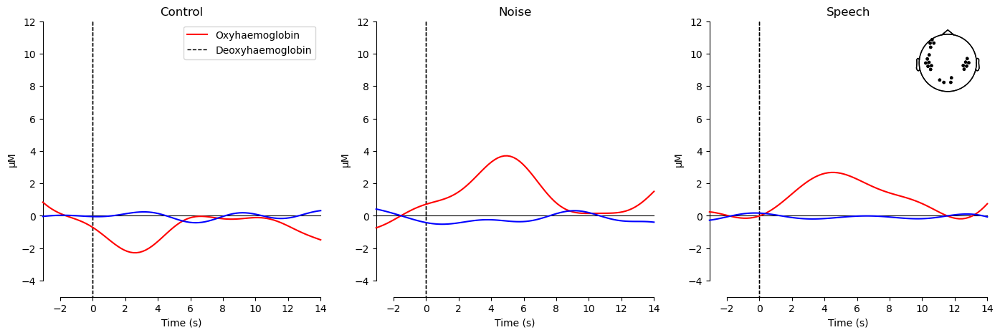

In [667]:
# Specify the figure size and limits per chromophore
fig, axes = plt.subplots(nrows=1, ncols=len(all_evokeds), figsize=(17, 5))
lims = dict(hbo=[-5, 12], hbr=[-5, 12])

for pick, color in zip(["hbo", "hbr"], ["r", "b"]):
    for idx, evoked in enumerate(all_evokeds):
        plot_compare_evokeds(
            {evoked: all_evokeds[evoked]},
            combine="mean",
            picks=pick,
            axes=axes[idx],
            show=False,
            colors=[color],
            legend=False,
            ylim=lims,
            ci=0.95,
            show_sensors=idx == 2,
        )
        axes[idx].set_title(f"{evoked}")
axes[0].legend(["Oxyhaemoglobin", "Deoxyhaemoglobin"])

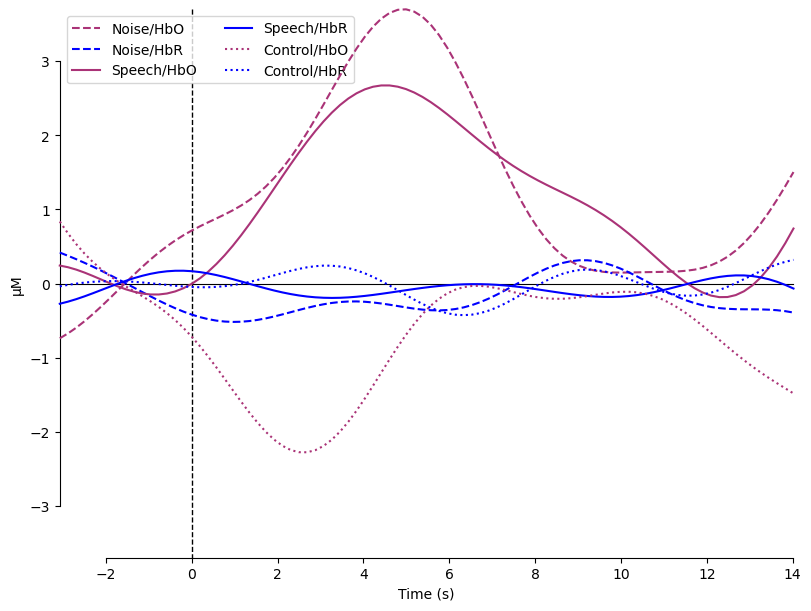

[<Figure size 800x600 with 1 Axes>]

In [668]:
import mne

evoked_dict = {'Noise/HbO': epochs['Noise'].average(picks='hbo'),
                'Noise/HbR': epochs['Noise'].average(picks='hbr'),
                'Speech/HbO': epochs['Speech'].average(picks='hbo'),
                'Speech/HbR': epochs['Speech'].average(picks='hbr'),
                'Control/HbO': epochs['Control'].average(picks='hbo'),
                'Control/HbR': epochs['Control'].average(picks='hbr')} 

for condition in evoked_dict:
    evoked_dict[condition].rename_channels(lambda x: x[:-4])
    
color_dict = dict(HbO='#AA3377', HbR='b')
styles_dict = dict(Control=dict(linestyle='dotted'), Noise=dict(linestyle='dashed'))

mne.viz.plot_compare_evokeds(evoked_dict, combine="mean", ci=0.95, colors=color_dict, styles=styles_dict,show=True)
                                
                                

In [669]:
from pprint import pprint

def filter_existing_pairs(raw_haemo, pairs):
    """Filter out SD pairs that are no longer present in raw_haemo."""
    valid_pairs = []
    for pair in pairs:
        try:
            # Check if the pair exists in raw_haemo
            idx = picks_pair_to_idx(raw_haemo, [pair])
            if idx:  # If valid index is returned, keep the pair
                valid_pairs.append(pair)
        except Exception:
            pass  # Ignore pairs that cause errors (likely removed)

    return valid_pairs

# Define ROI channel pairs
left = [[4, 2], [4, 3], [5, 2], [5, 3], [5, 4], [5, 5]]
right = [[10, 9], [10, 10], [10, 11], [10, 12], [11, 11], [11, 12]]
back = [[6, 6], [6, 8], [7, 6], [7, 7], [7, 8], [8, 7], [8, 8], [9, 8]]
front = [[1, 1], [2, 1], [3, 1], [3, 2], [12, 1]]

# Filter out missing SD pairs
left = filter_existing_pairs(raw_haemo, left)
right = filter_existing_pairs(raw_haemo, right)
back = filter_existing_pairs(raw_haemo, back)
front = filter_existing_pairs(raw_haemo, front)

# Generate indices for remaining pairs
rois = dict(
    Left_Hemisphere=picks_pair_to_idx(raw_haemo, left),
    Right_Hemisphere=picks_pair_to_idx(raw_haemo, right),
    Back=picks_pair_to_idx(raw_haemo, back),
    Front=picks_pair_to_idx(raw_haemo, front),
)

# Print the final valid SD pairs per ROI
print("\nFinal valid SD pairs per ROI:")
pprint({
    "Left_Hemisphere": left,
    "Right_Hemisphere": right,
    "Back": back,
    "Front": front
})

# Print the valid indices per ROI
print("\nFinal ROI indices:")
pprint(rois)



Final valid SD pairs per ROI:
{'Back': [[6, 6], [6, 8], [7, 6], [7, 7], [7, 8], [8, 7], [8, 8], [9, 8]],
 'Front': [[1, 1], [2, 1], [3, 1], [3, 2], [12, 1]],
 'Left_Hemisphere': [[4, 2], [4, 3], [5, 2], [5, 3], [5, 4], [5, 5]],
 'Right_Hemisphere': [[10, 9],
                      [10, 10],
                      [10, 11],
                      [10, 12],
                      [11, 11],
                      [11, 12]]}

Final ROI indices:
{'Back': [np.int64(20),
          np.int64(21),
          np.int64(22),
          np.int64(23),
          np.int64(24),
          np.int64(25),
          np.int64(26),
          np.int64(27),
          np.int64(28),
          np.int64(29),
          np.int64(30),
          np.int64(31),
          np.int64(32),
          np.int64(33),
          np.int64(34),
          np.int64(35)],
 'Front': [np.int64(0),
           np.int64(1),
           np.int64(2),
           np.int64(3),
           np.int64(4),
           np.int64(5),
           np.int64(6),
      

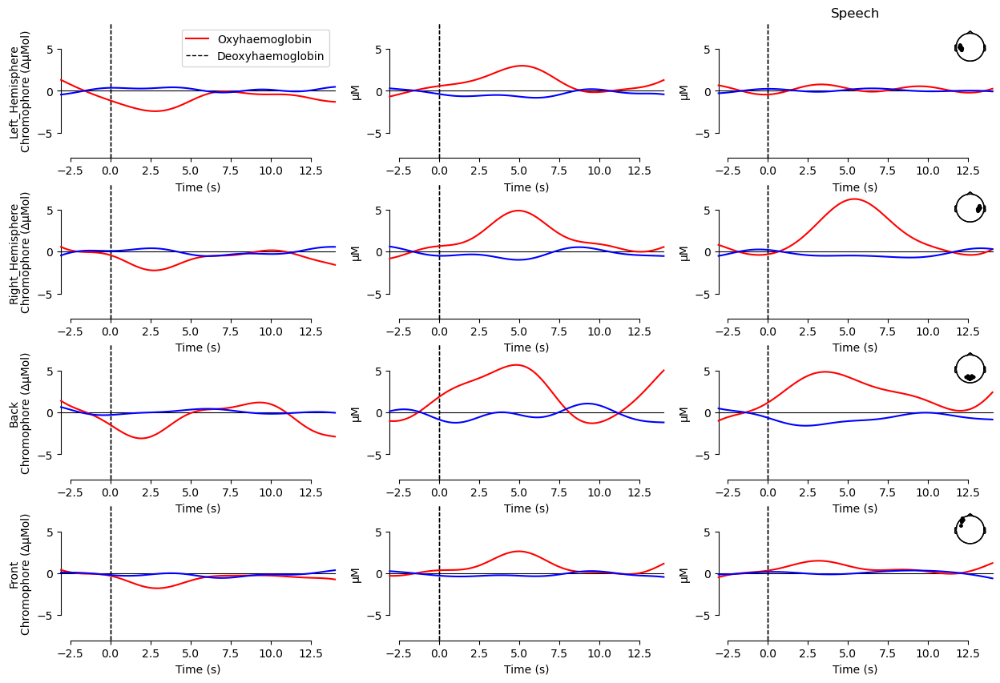

In [670]:
# Specify the figure size and limits per chromophore.
fig, axes = plt.subplots(nrows=len(rois), ncols=len(all_evokeds), figsize=(15, 10))
lims = dict(hbo=[-8, 8], hbr=[-8, 8])

for pick, color in zip(["hbo", "hbr"], ["r", "b"]):
    for ridx, roi in enumerate(rois):
        for cidx, evoked in enumerate(all_evokeds):
            if pick == "hbr":
                picks = rois[roi][1::2]  # Select only the hbr channels
            else:
                picks = rois[roi][0::2]  # Select only the hbo channels

            plot_compare_evokeds(
                {evoked: all_evokeds[evoked]},
                combine="mean",
                picks=picks,
                axes=axes[ridx, cidx],
                show=False,
                colors=[color],
                legend=False,
                ylim=lims,
                ci=0.95,
                show_sensors=cidx == 2,
            )
            axes[ridx, cidx].set_title("")
        axes[0, cidx].set_title(f"{evoked}")
        axes[ridx, 0].set_ylabel(f"{roi}\nChromophore (ΔμMol)")
axes[0, 0].legend(["Oxyhaemoglobin", "Deoxyhaemoglobin"])

# show the figure

plt.show()

# All subjects

Detected subjects: ['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24']
Removing break annotations for the orginal raw...
Removing break annotations for the cropped raw...
Bad channels: ['S4_D14 785', 'S4_D14 830', 'S5_D15 785', 'S5_D15 830', 'S6_D6 785', 'S6_D6 830', 'S6_D8 785', 'S6_D8 830', 'S7_D6 785', 'S7_D6 830', 'S7_D8 785', 'S7_D8 830', 'S8_D17 785', 'S8_D17 830', 'S9_D8 785', 'S9_D8 830']
Number of bad channels: 16
Subject 01, Session 01: 60 epochs left
Removing break annotations for the orginal raw...
Removing break annotations for the cropped raw...
Bad channels: ['S2_D13 785', 'S2_D13 830', 'S7_D6 785', 'S7_D6 830', 'S7_D8 785', 'S7_D8 830', 'S8_D7 785', 'S8_D7 830', 'S8_D17 785', 'S8_D17 830', 'S9_D8 785', 'S9_D8 830', 'S10_D18 785', 'S10_D18 830', 'S12_D20 785', 'S12_D20 830']
Number of bad channels: 16
Subject 01, Session 02: 59 epochs left
Removing break annotations for the orgin

C:\Users\sarab\AppData\Local\Temp\ipykernel_17008\2714038888.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(nrows=1, ncols=len(indiv_evoked), figsize=(17, 5))


Removing break annotations for the orginal raw...
Removing break annotations for the cropped raw...
Bad channels: ['S2_D13 785', 'S2_D13 830', 'S4_D14 785', 'S4_D14 830', 'S11_D19 785', 'S11_D19 830', 'S12_D20 785', 'S12_D20 830']
Number of bad channels: 8
Subject 12, Session 02: 59 epochs left
Removing break annotations for the orginal raw...
Removing break annotations for the cropped raw...
Bad channels: ['S2_D13 785', 'S2_D13 830', 'S4_D14 785', 'S4_D14 830', 'S5_D15 785', 'S5_D15 830', 'S6_D16 785', 'S6_D16 830', 'S7_D8 785', 'S7_D8 830', 'S10_D12 785', 'S10_D12 830', 'S12_D20 785', 'S12_D20 830']
Number of bad channels: 14
Subject 13, Session 01: 60 epochs left
Removing break annotations for the orginal raw...
Removing break annotations for the cropped raw...
Bad channels: ['S4_D14 785', 'S4_D14 830', 'S6_D16 785', 'S6_D16 830', 'S7_D8 785', 'S7_D8 830', 'S9_D8 785', 'S9_D8 830', 'S11_D19 785', 'S11_D19 830', 'S12_D20 785', 'S12_D20 830']
Number of bad channels: 12
Subject 13, Ses

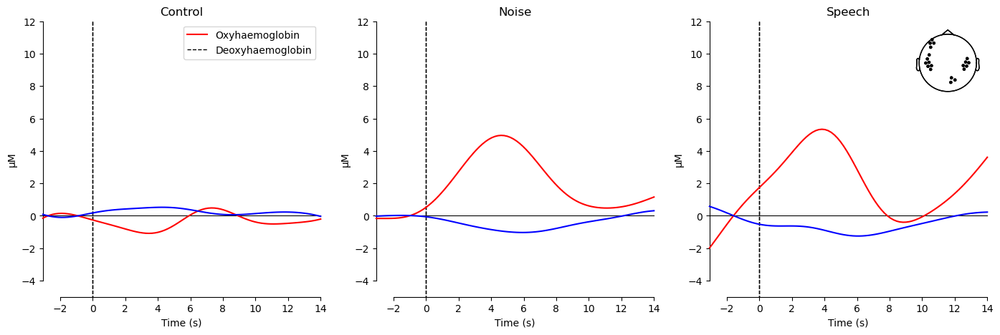

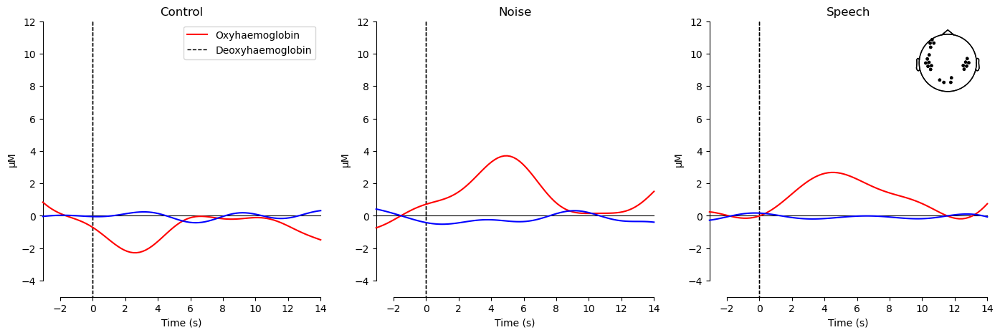

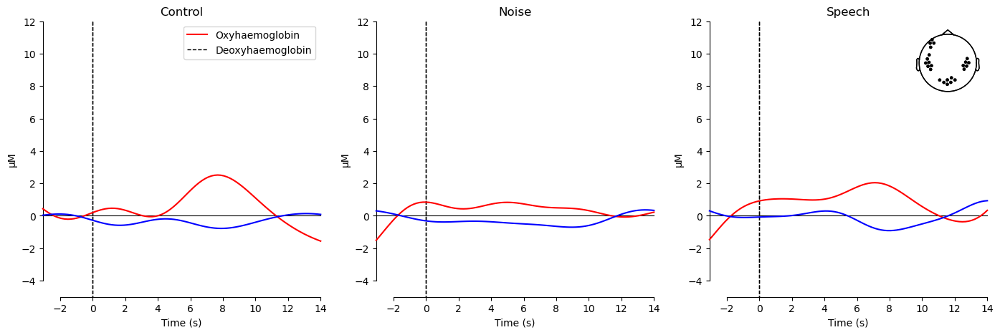

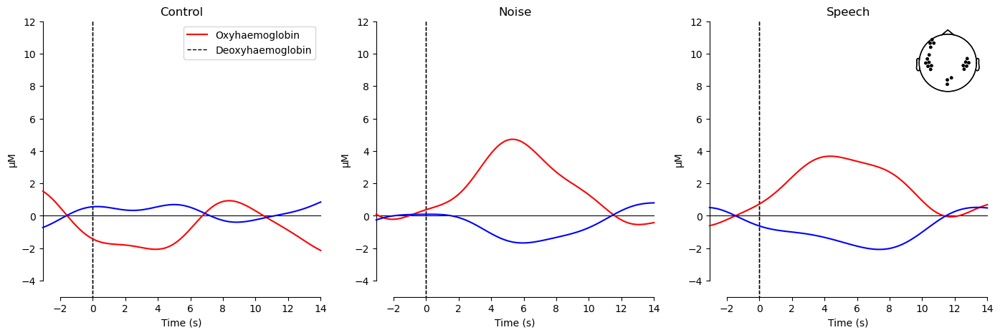

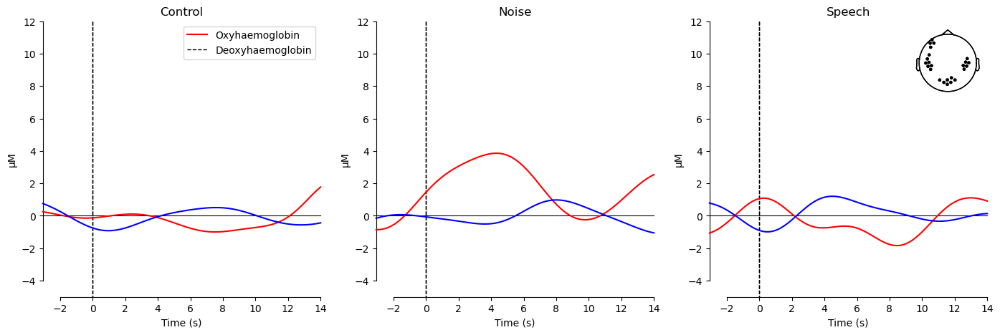

...

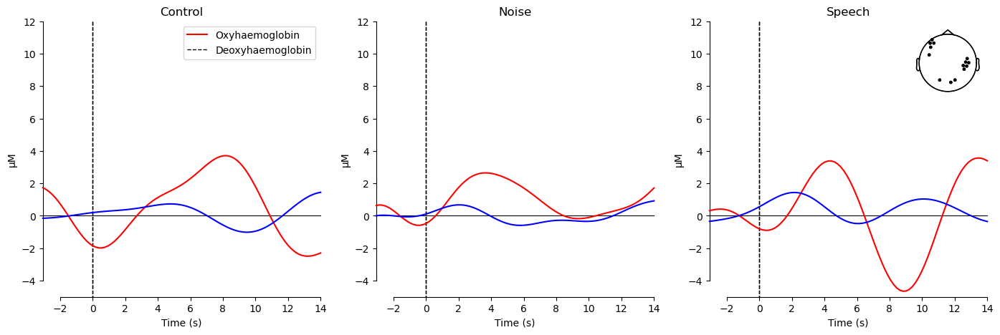

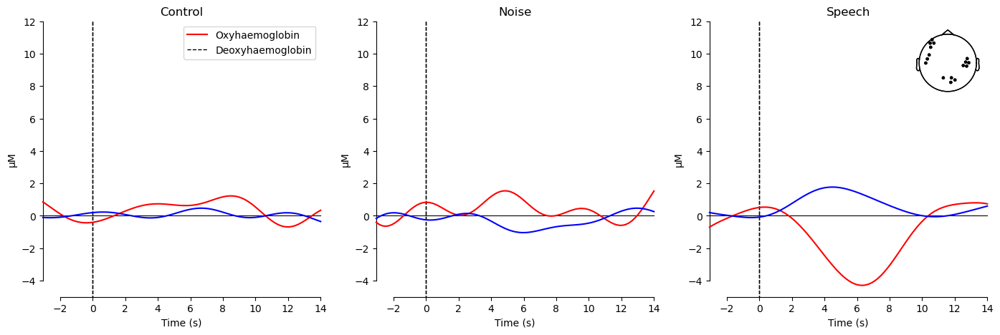

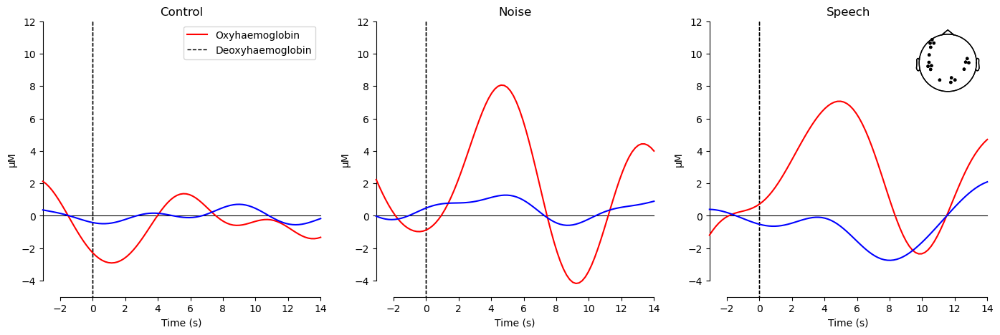

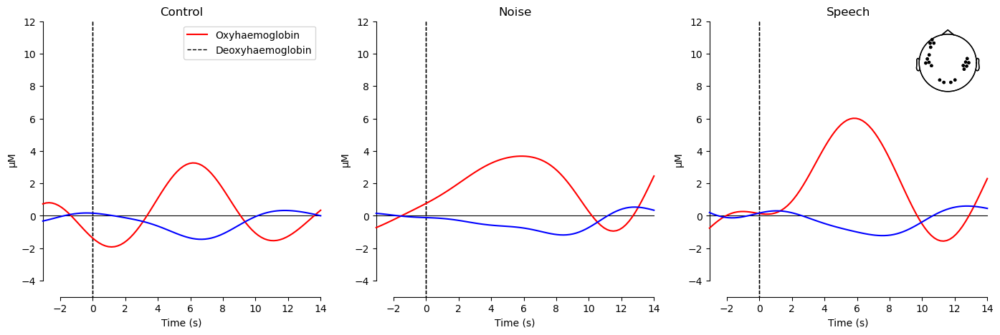

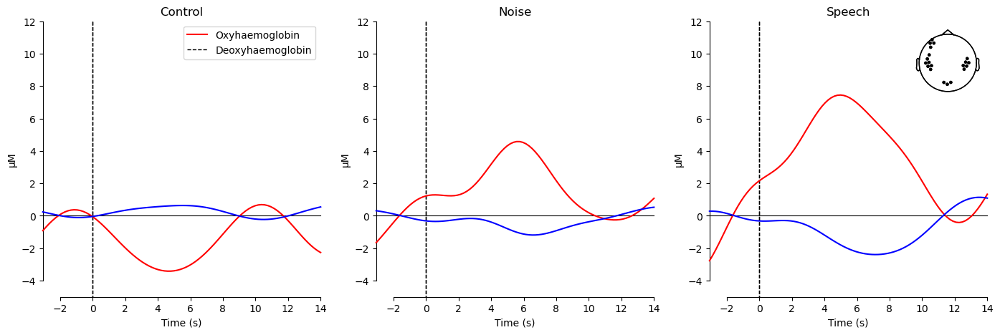

In [ ]:
all_evokeds = defaultdict(list)

bids_root = r"C:\Datasets\Test-retest study\bids_dataset"

# Get subject folders from the dataset
subject_list = sorted([d for d in os.listdir(bids_root) if d.startswith("sub-")])
subject_list = [s.replace("sub-", "") for s in subject_list]  # Extract subject numbers

print("Detected subjects:", subject_list)

# initialize the list of subjects df it has 2 columns, one for subject and one for session
subjects_df = pd.DataFrame(columns=["subject", "session"])

#for sub in range(1,2):  # Loop over subjects
for sub in subject_list:  # Loop over subjects
    for ses in range(1, 3):  
        bids_path = BIDSPath(
            #subject=f"{sub:02d}",
            subject=f"{sub}",
            session=f"{ses:02d}",
            task="auditory",
            datatype="nirs",
            root=bids_root,
            suffix="nirs",
            extension=".snirf",
        )

        # Analyse data
        raw_haemo, epochs, event_dict, raw_od = individual_analysis(bids_path)
        
        if raw_haemo is None:
            print(f"⚠️ Not enough channels left for Subject {sub}, Session {ses:02d}. Skipping...")
            #print(f"⚠️ Not enough channels left for Subject {sub:02d}, Session {ses:02d}. Skipping...")
            continue

        # Check if epochs contain data
        #print(f"Subject {sub:02d}, Session {ses:02d}: {len(epochs)} epochs left")
        print(f"Subject {sub}, Session {ses:02d}: {len(epochs)} epochs left")

        if len(epochs) < 10:
            #print(f"⚠️ Not enough epochs left for Subject {sub:02d}, Session {ses:02d}. Skipping...")
            print(f"⚠️ Not enough epochs left for Subject {sub}, Session {ses:02d}. Skipping...")
            # plot the raw_haemo data
            #raw_haemo.plot(n_channels=30, duration=300, show=True)
            
            continue  # Skip this subject/session
        
        """ for condition in [ "Speech"]:
            if condition in event_dict:
                epochs[condition].plot(event_id=event_dict) """
                
        # If the subject has not been skipped save in a dataframe the name and session
        subjects_df = pd.concat([subjects_df, pd.DataFrame({"subject": [sub], "session": [ses]})], ignore_index=True)
        
        indiv_evoked = defaultdict(list)
        # For each individual subject, plot the evoked responses
        for condition in epochs.event_id:
            indiv_evoked[condition]= (epochs[condition].average())
        
        fig, axes = plt.subplots(nrows=1, ncols=len(indiv_evoked), figsize=(17, 5))
        lims = dict(hbo=[-5, 12], hbr=[-5, 12])
        
        # print participant number and session
        print(f"Participant {sub}, Session {ses:02d}")

        for pick, color in zip(["hbo", "hbr"], ["r", "b"]):
            for idx, evoked in enumerate(indiv_evoked):
                plot_compare_evokeds(
                    {evoked: indiv_evoked[evoked]},
                    combine="mean",
                    picks=pick,
                    axes=axes[idx],
                    show=False,
                    colors=[color],
                    legend=False,
                    ylim=lims,
                    ci=0.95,
                    show_sensors=idx == 2,
        )
                axes[idx].set_title(f"{evoked}")
        axes[0].legend(["Oxyhaemoglobin", "Deoxyhaemoglobin"])
        
        # show the figure
        plt.show()
        
        
        
        # Save individual-evoked participant data
        for condition in epochs.event_id:
            all_evokeds[condition].append(epochs[condition].average())
# Save the dataframe to a csv file
subjects_df.to_csv("subjects_df.csv", index=True)


In [672]:
all_evokeds['Speech']

[<Evoked | 'Speech' (average, N=20), -3.072 – 14.016 s, baseline -3.072 – 0 s, 50 ch, ~91 KiB>,
 <Evoked | 'Speech' (average, N=19), -3.072 – 14.016 s, baseline -3.072 – 0 s, 50 ch, ~91 KiB>,
 <Evoked | 'Speech' (average, N=20), -3.072 – 14.016 s, baseline -3.072 – 0 s, 50 ch, ~91 KiB>,
 <Evoked | 'Speech' (average, N=20), -3.072 – 14.016 s, baseline -3.072 – 0 s, 50 ch, ~91 KiB>,
 <Evoked | 'Speech' (average, N=20), -3.072 – 14.016 s, baseline -3.072 – 0 s, 50 ch, ~91 KiB>,
 <Evoked | 'Speech' (average, N=20), -3.072 – 14.016 s, baseline -3.072 – 0 s, 50 ch, ~91 KiB>,
 <Evoked | 'Speech' (average, N=20), -3.072 – 14.016 s, baseline -3.072 – 0 s, 50 ch, ~91 KiB>,
 <Evoked | 'Speech' (average, N=18), -3.072 – 14.016 s, baseline -3.072 – 0 s, 50 ch, ~91 KiB>,
 <Evoked | 'Speech' (average, N=20), -3.072 – 14.016 s, baseline -3.072 – 0 s, 50 ch, ~91 KiB>,
 <Evoked | 'Speech' (average, N=16), -3.072 – 14.016 s, baseline -3.072 – 0 s, 50 ch, ~91 KiB>,
 <Evoked | 'Speech' (average, N=20), -3.

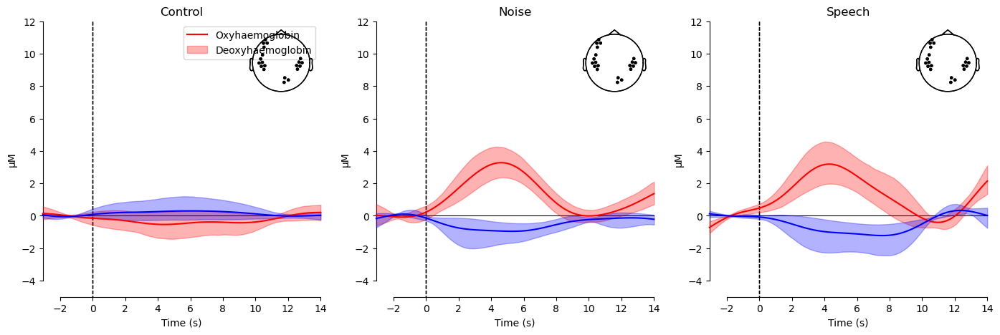

In [673]:
# Specify the figure size and limits per chromophore
fig, axes = plt.subplots(nrows=1, ncols=len(all_evokeds), figsize=(17, 5))
lims = dict(hbo=[-5, 12], hbr=[-5, 12])

for pick, color in zip(["hbo", "hbr"], ["r", "b"]):
    for idx, evoked in enumerate(all_evokeds):
        plot_compare_evokeds(
            {evoked: all_evokeds[evoked]},
            combine="mean",
            picks=pick,
            axes=axes[idx],
            show=False,
            colors=[color],
            legend=False,
            ylim=lims,
            ci=0.95,
            show_sensors=True
            
        )
        axes[idx].set_title(f"{evoked}")
axes[0].legend(["Oxyhaemoglobin", "Deoxyhaemoglobin"])

## All optodes separate plots

In [674]:
""" import matplotlib.pyplot as plt
from mne.viz import plot_compare_evokeds
import seaborn as sns

# Define figure size and limits per chromophore
num_patients = len(next(iter(all_evokeds.values())))  # Get number of patients
num_conditions = len(all_evokeds)  # Get number of conditions (e.g., Control, Noise, Speech)

fig, axes = plt.subplots(nrows=num_patients, ncols=num_conditions, figsize=(17, num_patients * 3), sharex=True, sharey=True)
lims = dict(hbo=[-5, 12], hbr=[-5, 12])  # Set consistent Y-axis limits

# Generate a color palette for different conditions (so each condition is distinct)
colors = sns.color_palette("husl", num_conditions)  

# Iterate over conditions (Control, Noise, Speech)
for cond_idx, (condition, evoked_list) in enumerate(all_evokeds.items()):  
    for patient_idx, evoked in enumerate(evoked_list):  
        ax = axes[patient_idx, cond_idx]  # Select subplot for (patient, condition)

        plot_compare_evokeds(
            {f"Patient {patient_idx + 1}": evoked},
            combine=None,  # Don't average, plot each patient separately
            picks="hbo",  # Plot only HbO
            axes=ax,
            show=False,
            colors=[colors[cond_idx]],  # Assign unique color per condition
            legend=False,
            ylim=lims,
            ci=0.95,
        )

        ax.set_xlim(0, 15)  # Keep X-axis consistent
        if cond_idx == 0:
            ax.set_ylabel(f"Patient {patient_idx + 1}")  # Label rows by patient number
        if patient_idx == 0:
            ax.set_title(f"{condition}")  # Label columns by condition

# Adjust layout for readability
plt.tight_layout()
plt.show()
 """

' import matplotlib.pyplot as plt\nfrom mne.viz import plot_compare_evokeds\nimport seaborn as sns\n\n# Define figure size and limits per chromophore\nnum_patients = len(next(iter(all_evokeds.values())))  # Get number of patients\nnum_conditions = len(all_evokeds)  # Get number of conditions (e.g., Control, Noise, Speech)\n\nfig, axes = plt.subplots(nrows=num_patients, ncols=num_conditions, figsize=(17, num_patients * 3), sharex=True, sharey=True)\nlims = dict(hbo=[-5, 12], hbr=[-5, 12])  # Set consistent Y-axis limits\n\n# Generate a color palette for different conditions (so each condition is distinct)\ncolors = sns.color_palette("husl", num_conditions)  \n\n# Iterate over conditions (Control, Noise, Speech)\nfor cond_idx, (condition, evoked_list) in enumerate(all_evokeds.items()):  \n    for patient_idx, evoked in enumerate(evoked_list):  \n        ax = axes[patient_idx, cond_idx]  # Select subplot for (patient, condition)\n\n        plot_compare_evokeds(\n            {f"Patient {pa

In [675]:
""" import matplotlib.pyplot as plt
from mne.viz import plot_compare_evokeds
import seaborn as sns

# Define figure size and limits per chromophore
fig, axes = plt.subplots(nrows=1, ncols=len(all_evokeds), figsize=(17, 5), sharey=True, sharex=True)
lims = dict(hbo=[-5, 15], hbr=[-5, 12])  # Define consistent y-axis limits

# Generate a color palette for different patients
num_patients = len(next(iter(all_evokeds.values())))  # Assuming each condition has the same number of patients
colors = sns.color_palette("husl", num_patients)  # Using seaborn for unique colors

# Iterate over conditions (control, noise, speech)
for idx, (condition, evoked_list) in enumerate(all_evokeds.items()):  
    ax = axes[idx]  # Use the same axis for all patients in this condition
    for patient_idx, evoked in enumerate(evoked_list):  
        plot_compare_evokeds(
            {f"Patient {patient_idx + 1}": evoked},
            combine=None,  # Don't average, plot each patient separately
            picks="hbo",  # Plot only HbO
            axes=ax,
            show=False,
            colors=[colors[patient_idx]],  # Assign unique color per patient
            legend=False,
            ylim=lims,
            ci=0.95,
        )

    ax.set_title(f"{condition}")
    ax.set_xlim(0, 15)  # Set x-axis to (0, 15)

# Add a single legend outside the plots
fig.legend(
    [f"Patient {i+1}" for i in range(num_patients)], 
    loc="upper right", 
    bbox_to_anchor=(1.1, 1),
    title="Patients"
)

plt.tight_layout()
plt.show()
 """

' import matplotlib.pyplot as plt\nfrom mne.viz import plot_compare_evokeds\nimport seaborn as sns\n\n# Define figure size and limits per chromophore\nfig, axes = plt.subplots(nrows=1, ncols=len(all_evokeds), figsize=(17, 5), sharey=True, sharex=True)\nlims = dict(hbo=[-5, 15], hbr=[-5, 12])  # Define consistent y-axis limits\n\n# Generate a color palette for different patients\nnum_patients = len(next(iter(all_evokeds.values())))  # Assuming each condition has the same number of patients\ncolors = sns.color_palette("husl", num_patients)  # Using seaborn for unique colors\n\n# Iterate over conditions (control, noise, speech)\nfor idx, (condition, evoked_list) in enumerate(all_evokeds.items()):  \n    ax = axes[idx]  # Use the same axis for all patients in this condition\n    for patient_idx, evoked in enumerate(evoked_list):  \n        plot_compare_evokeds(\n            {f"Patient {patient_idx + 1}": evoked},\n            combine=None,  # Don\'t average, plot each patient separately\n 

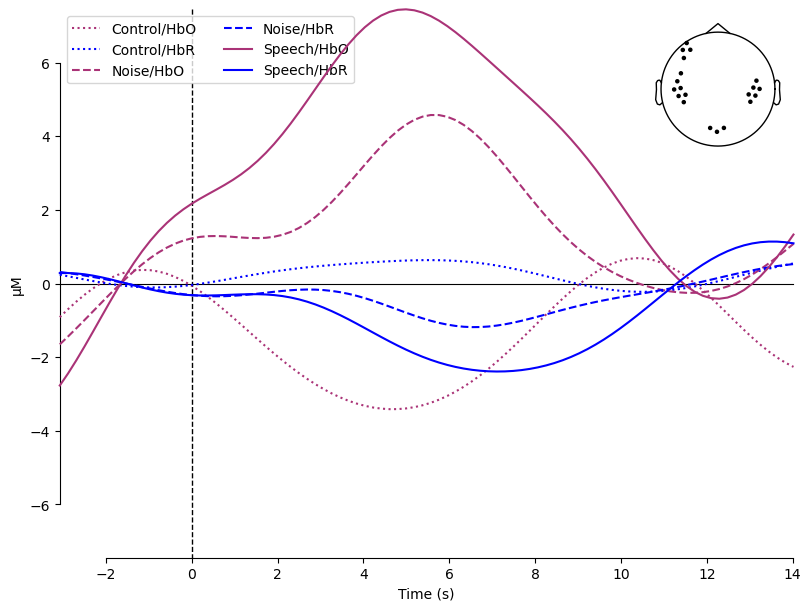

[<Figure size 800x600 with 2 Axes>]

In [676]:
import mne

evoked_dict_control = {
                'Control/HbO': epochs['Control'].average(picks='hbo'),
                'Control/HbR': epochs['Control'].average(picks='hbr'),
                'Noise/HbO': epochs['Noise'].average(picks='hbo'),
                'Noise/HbR': epochs['Noise'].average(picks='hbr'),
                'Speech/HbO': epochs['Speech'].average(picks='hbo'),
                'Speech/HbR': epochs['Speech'].average(picks='hbr')
                } 

for condition in evoked_dict_control:
    evoked_dict_control[condition].rename_channels(lambda x: x[:-4])
    
    
color_dict = dict(HbO='#AA3377', HbR='b')
styles_dict = dict(Control=dict(linestyle='dotted'), Noise=dict(linestyle='dashed'))

lims = dict(hbo=[-5, 12])

mne.viz.plot_compare_evokeds(evoked_dict_control, combine= 'mean', colors=color_dict,show=True, show_sensors=True, styles= styles_dict, ci=0.95)
                                
                                

In [677]:
epochs['Noise'].average(picks='hbo').info['bads']

['S6_D6 hbo', 'S7_D6 hbo', 'S7_D7 hbo', 'S7_D8 hbo', 'S8_D7 hbo']

In [678]:
from pprint import pprint

def filter_existing_pairs(raw_haemo, pairs):
    """Filter out SD pairs that are no longer present in raw_haemo."""
    valid_pairs = []
    for pair in pairs:
        try:
            # Check if the pair exists in raw_haemo
            idx = picks_pair_to_idx(raw_haemo, [pair])
            if idx:  # If valid index is returned, keep the pair
                valid_pairs.append(pair)
        except Exception:
            pass  # Ignore pairs that cause errors (likely removed)

    return valid_pairs

# Define ROI channel pairs
left = [[4, 2], [4, 3], [5, 2], [5, 3], [5, 4], [5, 5]]
right = [[10, 9], [10, 10], [10, 11], [10, 12], [11, 11], [11, 12]]
back = [[6, 6], [6, 8], [7, 6], [7, 7], [7, 8], [8, 7], [8, 8], [9, 8]]
front = [[1, 1], [2, 1], [3, 1], [3, 2], [12, 1]]

# Filter out missing SD pairs
left = filter_existing_pairs(raw_haemo, left)
right = filter_existing_pairs(raw_haemo, right)
back = filter_existing_pairs(raw_haemo, back)
front = filter_existing_pairs(raw_haemo, front)

# Generate indices for remaining pairs
rois = dict(
    Left_Hemisphere=picks_pair_to_idx(raw_haemo, left),
    Right_Hemisphere=picks_pair_to_idx(raw_haemo, right),
    Back=picks_pair_to_idx(raw_haemo, back),
    Front=picks_pair_to_idx(raw_haemo, front),
)

# Print the final valid SD pairs per ROI
print("\nFinal valid SD pairs per ROI:")
pprint({
    "Left_Hemisphere": left,
    "Right_Hemisphere": right,
    "Back": back,
    "Front": front
})

""" # Print the valid indices per ROI
print("\nFinal ROI indices:")
pprint(rois) """



Final valid SD pairs per ROI:
{'Back': [[6, 6], [6, 8], [7, 6], [7, 7], [7, 8], [8, 7], [8, 8], [9, 8]],
 'Front': [[1, 1], [2, 1], [3, 1], [3, 2], [12, 1]],
 'Left_Hemisphere': [[4, 2], [4, 3], [5, 2], [5, 3], [5, 4], [5, 5]],
 'Right_Hemisphere': [[10, 9],
                      [10, 10],
                      [10, 11],
                      [10, 12],
                      [11, 11],
                      [11, 12]]}


' # Print the valid indices per ROI\nprint("\nFinal ROI indices:")\npprint(rois) '

In [679]:
len(all_evokeds['Control'])
all_evokeds['Control'][1].data.shape

(50, 90)

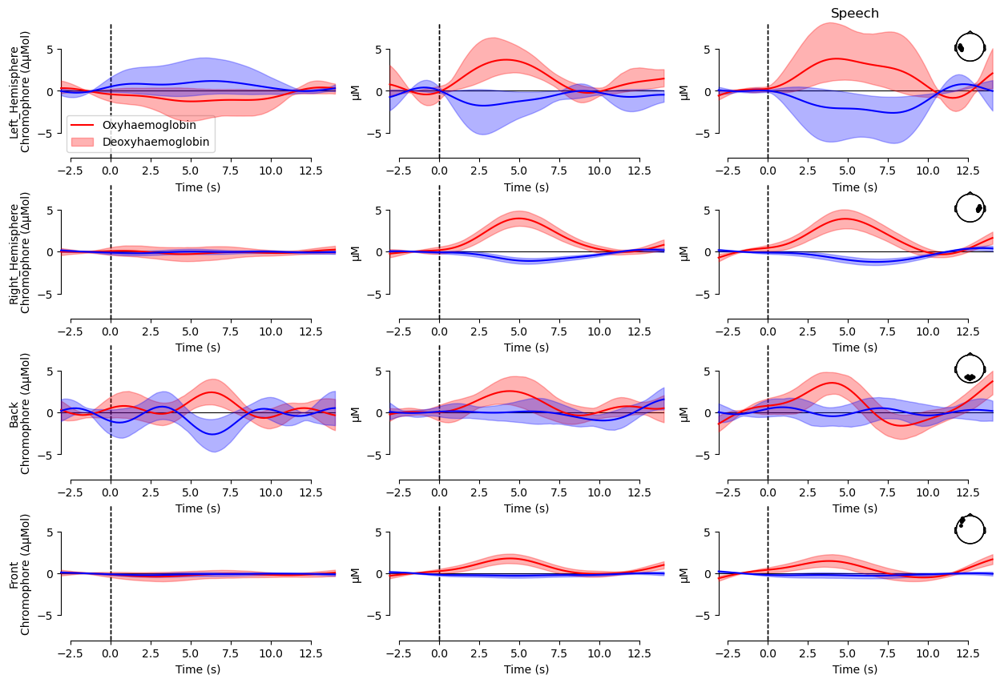

In [680]:
# Specify the figure size and limits per chromophore.
fig, axes = plt.subplots(nrows=len(rois), ncols=len(all_evokeds), figsize=(15, 10))
lims = dict(hbo=[-8, 8], hbr=[-8, 8])

for pick, color in zip(["hbo", "hbr"], ["r", "b"]):
    for ridx, roi in enumerate(rois):
        for cidx, evoked in enumerate(all_evokeds):
            if pick == "hbr":
                picks = rois[roi][1::2]  # Select only the hbr channels
            else:
                picks = rois[roi][0::2]  # Select only the hbo channels - even

            plot_compare_evokeds(
                {evoked: all_evokeds[evoked]},
                combine='mean',
                picks=picks,
                axes=axes[ridx, cidx],
                show=False,
                colors=[color],
                legend=False,
                ylim=lims,
                ci=0.95,
                show_sensors=cidx == 2,
            )
            axes[ridx, cidx].set_title("")
        axes[0, cidx].set_title(f"{evoked}")
        axes[ridx, 0].set_ylabel(f"{roi}\nChromophore (ΔμMol)")
axes[0, 0].legend(["Oxyhaemoglobin", "Deoxyhaemoglobin"])

# show the figure

plt.show()

## ROIs separate plots for all subjects and sessions

C:\Users\sarab\AppData\Local\Temp\ipykernel_17008\2073145344.py:43: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


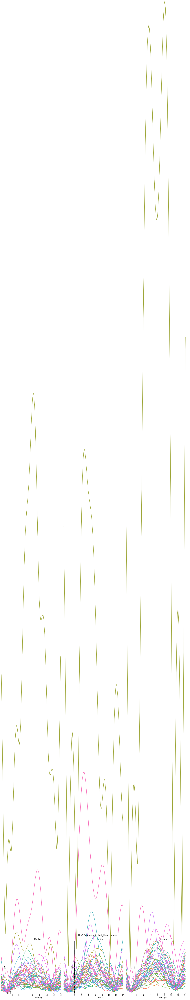

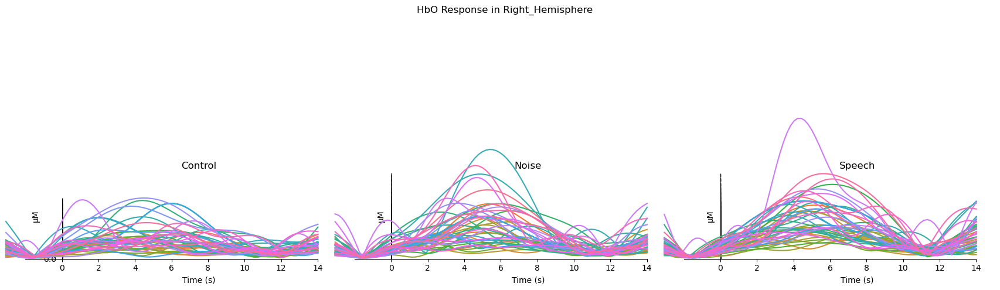

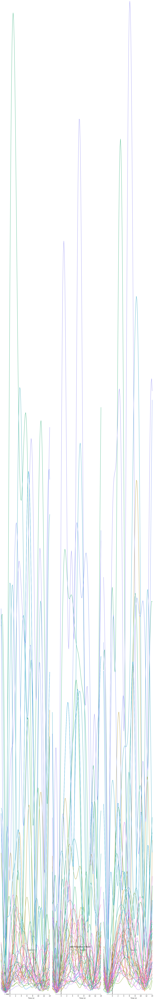

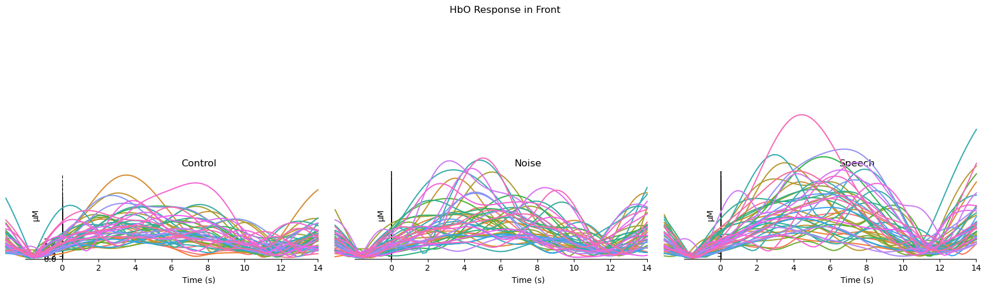

In [681]:
import matplotlib.pyplot as plt
from mne.viz import plot_compare_evokeds
import seaborn as sns

# Define limits for HbO signal
lims = dict(hbr=[-8, 8])  

# Generate a color palette for different patients
num_patients = len(next(iter(all_evokeds.values())))  # Get number of patients
colors = sns.color_palette("husl", num_patients)  # Unique colors for each patient

# Iterate over each ROI and create a separate figure for it
for roi in rois:
    fig, axes = plt.subplots(nrows=1, ncols=len(all_evokeds), figsize=(17, 5), sharey=True)
    
    # Iterate over each condition (e.g., Control, Noise, Speech)
    for cond_idx, (condition, evoked_list) in enumerate(all_evokeds.items()):  
        ax = axes[cond_idx]  # Select the correct subplot for this condition
        
        # Iterate over each patient
        for patient_idx, evoked in enumerate(evoked_list):  
            picks = rois[roi][0::2]  # Select only the HbO channels for this ROI
            
            plot_compare_evokeds(
                {f"Patient {patient_idx}": evoked},
                combine=None,  # Don't average, plot each patient separately
                picks=picks,
                axes=ax,
                show=False,
                colors=[colors[patient_idx]],  # Assign a unique color per patient
                legend=False,
                ylim=lims,
                ci=0.95,
            )

        ax.set_xlim(0, 15)  # Keep X-axis consistent
        ax.set_title(f"{condition}")  # Label each condition
        ax.set_xlabel("Time (s)")

    
    
    plt.suptitle(f"HbO Response in {roi}")  # Add a main title for the figure
    plt.tight_layout()
    plt.show()
 

In [682]:
""" import matplotlib.pyplot as plt
from mne.viz import plot_compare_evokeds
import seaborn as sns

# Define limits for HbO signal
lims = dict(hbo=[-5, 12])  

# Get the number of patients and conditions
num_patients = len(next(iter(all_evokeds.values())))  
num_conditions = len(all_evokeds)  

# Generate a color palette for different conditions
colors = sns.color_palette("husl", num_conditions)  

# Iterate over each ROI and create a separate figure for it
for roi in rois:
    fig, axes = plt.subplots(nrows=num_patients, ncols=num_conditions, figsize=(17, num_patients * 3), sharex=True, sharey=True)

    # Iterate over conditions (Control, Noise, Speech)
    for cond_idx, (condition, evoked_list) in enumerate(all_evokeds.items()):  
        for patient_idx, evoked in enumerate(evoked_list):  
            ax = axes[patient_idx, cond_idx]  # Select subplot for (patient, condition)
            
            # Select only the HbO channels for this ROI
            picks = rois[roi][0::2]  

            plot_compare_evokeds(
                {f"Patient {patient_idx + 1}": evoked},
                combine=None,  
                picks=picks,  
                axes=ax,
                show=False,
                colors=[colors[cond_idx]],  
                legend=False,
                ylim=lims,
                ci=0.95,
            )

            ax.set_xlim(0, 15)  # Keep X-axis consistent
            if cond_idx == 0:
                ax.set_ylabel(f"Patient {patient_idx + 1}")  
            if patient_idx == 0:
                ax.set_title(f"{condition}")  

    plt.suptitle(f"HbO Response in {roi}")  # Add title for each ROI figure
    plt.tight_layout()
    plt.show()
 """

' import matplotlib.pyplot as plt\nfrom mne.viz import plot_compare_evokeds\nimport seaborn as sns\n\n# Define limits for HbO signal\nlims = dict(hbo=[-5, 12])  \n\n# Get the number of patients and conditions\nnum_patients = len(next(iter(all_evokeds.values())))  \nnum_conditions = len(all_evokeds)  \n\n# Generate a color palette for different conditions\ncolors = sns.color_palette("husl", num_conditions)  \n\n# Iterate over each ROI and create a separate figure for it\nfor roi in rois:\n    fig, axes = plt.subplots(nrows=num_patients, ncols=num_conditions, figsize=(17, num_patients * 3), sharex=True, sharey=True)\n\n    # Iterate over conditions (Control, Noise, Speech)\n    for cond_idx, (condition, evoked_list) in enumerate(all_evokeds.items()):  \n        for patient_idx, evoked in enumerate(evoked_list):  \n            ax = axes[patient_idx, cond_idx]  # Select subplot for (patient, condition)\n            \n            # Select only the HbO channels for this ROI\n            pick